# Exploratory data analysis

### 1. Import libraries

In [1]:
%matplotlib inline
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

### 2. Load dataset

In [2]:
df_tweet = pd.read_csv("../data/train_E6oV3lV.csv")
df_tweet.head(5)

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation


In [3]:
print("Type of the dataset: ", type(df_tweet))
print("Keys: ", df_tweet.keys())

Type of the dataset:  <class 'pandas.core.frame.DataFrame'>
Keys:  Index(['id', 'label', 'tweet'], dtype='object')


### 3. Check dataset

In [4]:
df_tweet.shape

(31962, 3)

In [5]:
df_tweet.dtypes

id        int64
label     int64
tweet    object
dtype: object

In [6]:
df_tweet.describe()

,id,label
count,31962.000000,31962.000000
mean,15981.500000,0.070146
std,9226.778988,0.255397
min,1.000000,0.000000
25%,7991.250000,0.000000
50%,15981.500000,0.000000
75%,23971.750000,0.000000
max,31962.000000,1.000000


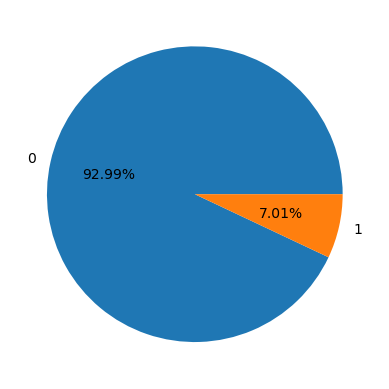

In [7]:
a = list(df_tweet.label.value_counts())
plt.pie(a,labels = [0, 1], autopct='%.2f%%')
plt.show()

### 4. Check duplicate rows

In [8]:
tmp = df_tweet.duplicated(subset=df_tweet.columns.tolist(), keep=False)
duplicated_rows = df_tweet[tmp]
duplicated_rows

,id,label,tweet


### 5. Check missing or null values

In [9]:
df_tweet.isnull().sum()

id       0
label    0
tweet    0
dtype: int64

# Data Cleaning

### 1. Import libraries

In [10]:
import re
import contractions
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from collections import Counter

### 2. Text Cleaning

In [11]:
df = df_tweet.copy()
df.head()

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation


In [12]:
def clean_text(tweet): # Remove URLs & mentions
    tweet = re.sub(r'http\S+', '', tweet)
    tweet = re.sub(r'@\w+', '', tweet)
    return tweet

In [13]:
df['tweet'] = df['tweet'].apply(clean_text)
df.head()

,id,label,tweet
0,1,0,when a father is dysfunctional and is so sel...
1,2,0,thanks for #lyft credit i can't use cause th...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation


In [14]:
## https://www.geeksforgeeks.org/nlp-expand-contractions-in-text-processing/

# Expand contractions in Text Processing
def expand_contractions(tweet):
    expanded_words = []
    for tw in tweet.split():
        #if tw != contractions.fix(tw): print(tw, contractions.fix(tw))
        expanded_words.append(contractions.fix(tw))
    new_text = ' '.join(expanded_words)
    return new_text

In [15]:
df['new_text'] = df['tweet'].apply(expand_contractions)
df.head()

,id,label,tweet,new_text
0,1,0,when a father is dysfunctional and is so sel...,when a father is dysfunctional and is so selfi...
1,2,0,thanks for #lyft credit i can't use cause th...,thanks for #lyft credit i cannot use because t...
2,3,0,bihday your majesty,bihday your majesty
3,4,0,#model i love u take with u all the time in ...,#model i love you take with you all the time i...
4,5,0,factsguide: society now #motivation,factsguide: society now #motivation


In [16]:
def remove_non_alpha(new_text):
    new_text = re.sub(r'[^a-zA-Z0-9\s]', '', new_text)
    return new_text

In [17]:
df['new_text'] = df['new_text'].apply(remove_non_alpha)
df.head()

,id,label,tweet,new_text
0,1,0,when a father is dysfunctional and is so sel...,when a father is dysfunctional and is so selfi...
1,2,0,thanks for #lyft credit i can't use cause th...,thanks for lyft credit i cannot use because th...
2,3,0,bihday your majesty,bihday your majesty
3,4,0,#model i love u take with u all the time in ...,model i love you take with you all the time in...
4,5,0,factsguide: society now #motivation,factsguide society now motivation


### 3. Tokenization

In [18]:
def tokenizer(new_text):
    tokens = word_tokenize(new_text)
    return tokens

In [19]:
df['tokens'] = df['new_text'].apply(tokenizer)
df.head()

,id,label,tweet,new_text,tokens
0,1,0,when a father is dysfunctional and is so sel...,when a father is dysfunctional and is so selfi...,"[when, a, father, is, dysfunctional, and, is, ..."
1,2,0,thanks for #lyft credit i can't use cause th...,thanks for lyft credit i cannot use because th...,"[thanks, for, lyft, credit, i, can, not, use, ..."
2,3,0,bihday your majesty,bihday your majesty,"[bihday, your, majesty]"
3,4,0,#model i love u take with u all the time in ...,model i love you take with you all the time in...,"[model, i, love, you, take, with, you, all, th..."
4,5,0,factsguide: society now #motivation,factsguide society now motivation,"[factsguide, society, now, motivation]"


In [20]:
def to_lowercase(lst_tokens):
    return [token.lower() for token in lst_tokens]

In [21]:
df['tokens'] = df['tokens'].apply(to_lowercase)
df.head()

,id,label,tweet,new_text,tokens
0,1,0,when a father is dysfunctional and is so sel...,when a father is dysfunctional and is so selfi...,"[when, a, father, is, dysfunctional, and, is, ..."
1,2,0,thanks for #lyft credit i can't use cause th...,thanks for lyft credit i cannot use because th...,"[thanks, for, lyft, credit, i, can, not, use, ..."
2,3,0,bihday your majesty,bihday your majesty,"[bihday, your, majesty]"
3,4,0,#model i love u take with u all the time in ...,model i love you take with you all the time in...,"[model, i, love, you, take, with, you, all, th..."
4,5,0,factsguide: society now #motivation,factsguide society now motivation,"[factsguide, society, now, motivation]"


### 4. Detecting Outliers for lenght of tweet

In [22]:
# Check length of tweet
df['length'] = df.tokens.str.len()
df.length.describe()

count    31962.00000
mean        12.35805
std          5.60989
min          0.00000
25%          8.00000
50%         12.00000
75%         16.00000
max         35.00000
Name: length, dtype: float64

<Axes: xlabel='length'>

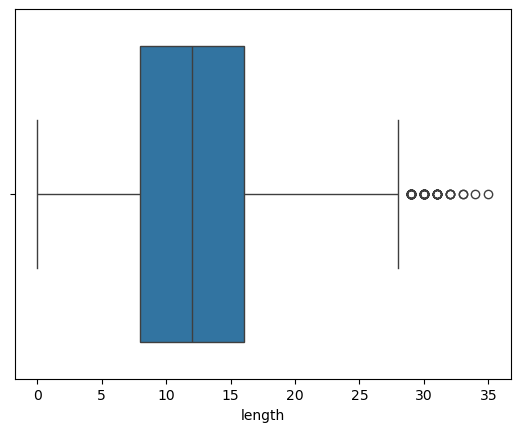

In [23]:
sns.boxplot(x=df['length'])

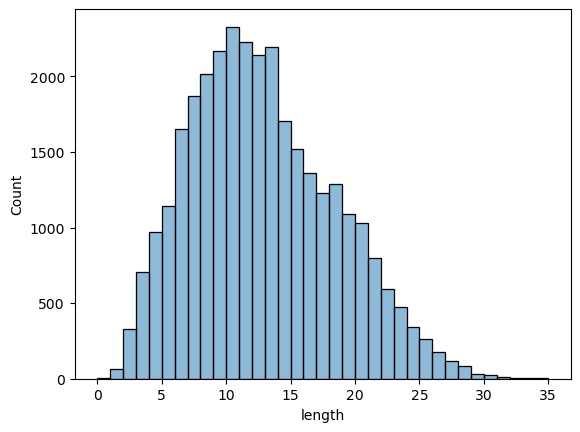

In [24]:
sns.histplot(data=df.length, bins=(max(df.length)-min(df.length)), alpha = 0.5)
plt.show()

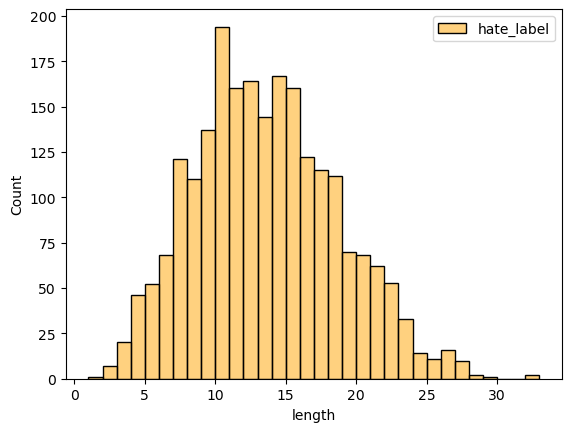

In [25]:
hate_label = df.length[df.label == 1]
sns.histplot(data=hate_label, bins=(max(hate_label)-min(hate_label)), alpha = 0.5, color='orange')
plt.legend(labels=['hate_label'])
plt.show()

In [26]:
Q1 = df['length'].quantile(.25)
Q3 = df['length'].quantile(.75)
IQR = Q3 - Q1

(31962, 6)
(31411, 6)


<Axes: xlabel='length'>

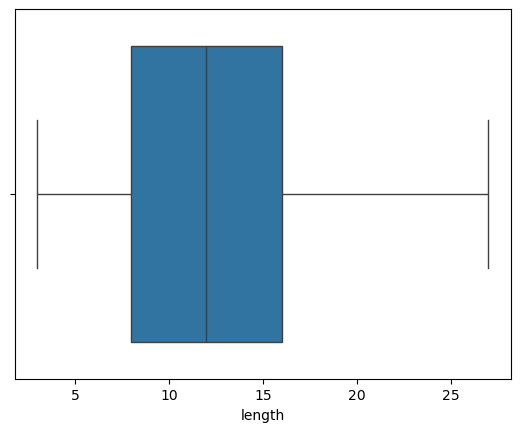

In [27]:
print(df.shape)
df_trimmed = df[((df.length < (Q3 + 1.5 * IQR)) & (df.length > 2))]
print(df_trimmed.shape)
sns.boxplot(x=df_trimmed['length'])

In [28]:
df_trimmed.length.describe()

count    31411.000000
mean        12.403489
std          5.405105
min          3.000000
25%          8.000000
50%         12.000000
75%         16.000000
max         27.000000
Name: length, dtype: float64

### 5. Removing Stopwords

In [29]:
def remove_stopwords(lst_tokens):
    stop_words = set(stopwords.words('english'))
    return [token for token in lst_tokens if token not in stop_words]

In [30]:
df['tokens'] = df['tokens'].apply(remove_stopwords)
df.head()

,id,label,tweet,new_text,tokens,length
0,1,0,when a father is dysfunctional and is so sel...,when a father is dysfunctional and is so selfi...,"[father, dysfunctional, selfish, drags, kids, ...",17
1,2,0,thanks for #lyft credit i can't use cause th...,thanks for lyft credit i cannot use because th...,"[thanks, lyft, credit, use, offer, wheelchair,...",19
2,3,0,bihday your majesty,bihday your majesty,"[bihday, majesty]",3
3,4,0,#model i love u take with u all the time in ...,model i love you take with you all the time in...,"[model, love, take, time]",13
4,5,0,factsguide: society now #motivation,factsguide society now motivation,"[factsguide, society, motivation]",4


### 6. Lemmatization or Stemming

In [31]:
def lemmatizer_tokens(lst_tokens):
    lemmatizer = WordNetLemmatizer()
    return [lemmatizer.lemmatize(token) for token in lst_tokens]

In [32]:
df['tokens'] = df['tokens'].apply(lemmatizer_tokens)
df.head()

,id,label,tweet,new_text,tokens,length
0,1,0,when a father is dysfunctional and is so sel...,when a father is dysfunctional and is so selfi...,"[father, dysfunctional, selfish, drag, kid, dy...",17
1,2,0,thanks for #lyft credit i can't use cause th...,thanks for lyft credit i cannot use because th...,"[thanks, lyft, credit, use, offer, wheelchair,...",19
2,3,0,bihday your majesty,bihday your majesty,"[bihday, majesty]",3
3,4,0,#model i love u take with u all the time in ...,model i love you take with you all the time in...,"[model, love, take, time]",13
4,5,0,factsguide: society now #motivation,factsguide society now motivation,"[factsguide, society, motivation]",4


### 7. Word Frequency Analysis

In [33]:
total_words = []
hate_tweets = []

for i in range(df.shape[0]):
    if df.label[i] == 1:
        for j in df.tokens[i]:
            hate_tweets.append(j)
    else:
        for j in df.tokens[i]:
            total_words.append(j)

print(len(total_words), len(hate_tweets))

228036 18145


In [34]:
word_count = Counter(total_words)
dict(word_count.most_common(10))

{'love': 2766,
 'day': 2735,
 'happy': 1679,
 'amp': 1319,
 'life': 1221,
 'time': 1205,
 'today': 1066,
 'get': 949,
 'like': 945,
 'positive': 932}

In [35]:
hate_count = Counter(hate_tweets)
dict(hate_count.most_common(10))

{'amp': 283,
 'trump': 216,
 'white': 153,
 'libtard': 149,
 'black': 146,
 'like': 140,
 'woman': 120,
 'racist': 109,
 'people': 106,
 'politics': 97}

### 8. Generate Word Clouds

In [36]:
from wordcloud import WordCloud
import matplotlib

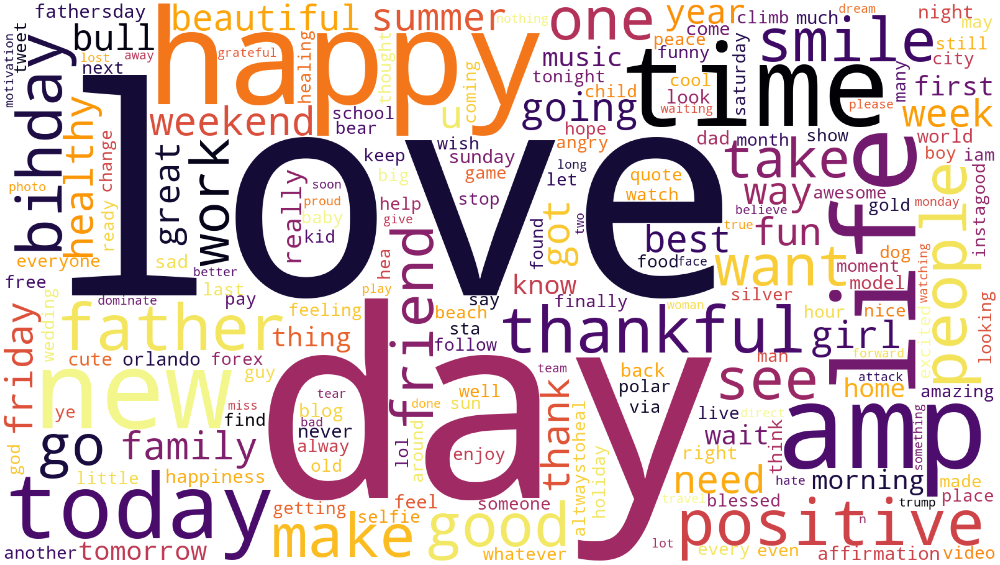

In [37]:
wordcloud = WordCloud(width=1600, height=900, random_state=1,
                      background_color="white", colormap=matplotlib.cm.inferno,
                      collocations=False).generate(' '.join(total_words))

# Plot
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud)
plt.axis("off")

# Save image
wordcloud.to_file("wordcloud_total.png")

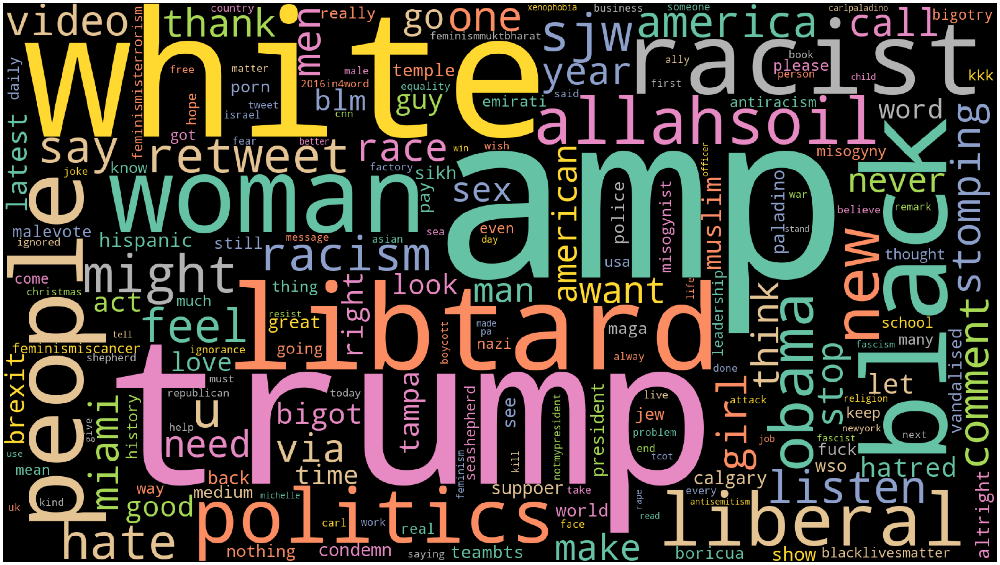

In [38]:
wordcloud = WordCloud(width=1600, height=900, random_state=1,
                      background_color='black', colormap='Set2',
                      collocations=False).generate(' '.join(hate_tweets))

# Plot
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud)
plt.axis("off")

# Save image
wordcloud.to_file("wordcloud_hate.png")

# Data Modeling

### 1. Import libraries

In [39]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression, SGDClassifier
from sklearn.naive_bayes import MultinomialNB
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score, roc_curve, classification_report, PrecisionRecallDisplay
from sklearn.pipeline import make_pipeline

### 2. Load dataset

In [40]:
train_data = pd.read_csv("../data/train_E6oV3lV.csv")
test_data = pd.read_csv('../data/test_tweets_anuFYb8.csv')

train = train_data.copy()
train_data['label'] = train_data['label'].astype('category')
train_data.head()

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation


In [50]:
print(train_data.shape, test_data.shape)

(31962, 5) (17197, 4)


In [41]:
def clean_text(text): # Remove URLs & mentions
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'@\w+', '', text)
    return text

def expand_contractions(text): # Expand contractions in text processing
    expanded_words = []
    for tx in text.split():
        #if tx != contractions.fix(tx): print(tx, contractions.fix(tx))
        expanded_words.append(contractions.fix(tx))
    new_text = ' '.join(expanded_words)
    return new_text

def remove_non_alpha(new_text):  # Extract only alphabets
    new_text = re.sub(r'[^a-zA-Z0-9\s]', '', new_text.lower())
    return new_text

def remove_stopwords(new_text): # Removing Stopwords
    stop_words = set(stopwords.words('english'))
    return " ".join(token for token in new_text.split() if token not in stop_words)

def word_lemma(new_text): # Remmatizer
    return " ".join([WordNetLemmatizer().lemmatize(token) for token in new_text.split()])

def tokenizer(new_text):
    return [token for token in new_text.split()]

def drop_column(df, column): # Drop column
    df = df.drop([column], axis=1)
    return df

for df in [train_data, test_data]:
    df['tweet'] = df['tweet'].apply(clean_text)
    df['tweet'] = df['tweet'].apply(expand_contractions)
    df['tweet'] = df['tweet'].apply(remove_non_alpha)
    df['features'] = df['tweet'].apply(remove_stopwords)
    df['features'] = df['features'].apply(word_lemma)
    df['tokens'] = df['features'].apply(tokenizer)


In [42]:
# oversampling
label_0 = train_data[train_data['label'] == 0] # label counting
label_1 = train_data[train_data['label'] == 1]

oversample = label_1.sample(len(label_0), replace=True, random_state=123)
train_oversampled = pd.concat([oversample, label_0], axis=0)
train_oversampled = train_oversampled.sample(frac = 1)
print(train_oversampled['label'].value_counts())
train_oversampled

label
0    29720
1    29720
Name: count, dtype: int64


,id,label,tweet,features,tokens
25973,25974,0,thoughts and prayers to her familie and friend...,thought prayer familie friend stay strong ripc...,"[thought, prayer, familie, friend, stay, stron..."
15206,15207,1,allahsoil the term jihad is a highlycontested ...,allahsoil term jihad highlycontested concept t...,"[allahsoil, term, jihad, highlycontested, conc..."
21658,21659,1,save the date 142017 sourcenation live wed 8 t...,save date 142017 sourcenation live wed 8 thepe...,"[save, date, 142017, sourcenation, live, wed, ..."
28805,28806,0,time to put on the ski alps titlus switzerlan...,time put ski alp titlus switzerland ski skiing...,"[time, put, ski, alp, titlus, switzerland, ski..."
10985,10986,0,i work with some of the fakest people ever sodone,work fakest people ever sodone,"[work, fakest, people, ever, sodone]"
...,...,...,...,...,...
27747,27748,1,just got done threatening my coworker to give ...,got done threatening coworker give money say b...,"[got, done, threatening, coworker, give, money..."
3787,3788,1,nigelfarage for too many years any criticism o...,nigelfarage many year criticism immigration ef...,"[nigelfarage, many, year, criticism, immigrati..."
29136,29137,1,why cannot women be defenders if they want,cannot woman defender want,"[cannot, woman, defender, want]"
21721,21722,0,watching angry birds birds birdsmovie,watching angry bird bird birdsmovie,"[watching, angry, bird, bird, birdsmovie]"


### 3. Model Building

In [43]:
# splitting data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(train_oversampled['features'], train_oversampled['label'], test_size=0.2, random_state=1234)

In [44]:
# set up models and test them
test_model = [MultinomialNB(), RandomForestClassifier(), DecisionTreeClassifier(), 
              LogisticRegression(solver='saga'), SVC(), KNeighborsClassifier(), SGDClassifier(), XGBClassifier()]

ALL_Cases_results = pd.DataFrame()
file = pd.DataFrame()

for val in test_model:
    # Feature extraction using TF-IDF
    # Choose a model from list
    pipe = make_pipeline(TfidfVectorizer(), val)
    pipe.fit(X_train, y_train)
    y_pred = pipe.predict(X_val)
    model = list(pipe.named_steps)
    result = classification_report(y_pred, y_val, output_dict=True)
    df_results = pd.DataFrame(result)
    df_results['model'] = model[1]
    file = pd.concat([file, df_results], axis=0)
    total_result6 = file

ALL_Cases_results = pd.concat([ALL_Cases_results, file[file.index == 'f1-score']], axis=0)
# f1-scores for 8 models
ALL_Cases_results

,0,1,accuracy,macro avg,weighted avg,model
f1-score,0.950320,0.954137,0.952305,0.952229,0.952371,multinomialnb
f1-score,0.984192,0.984838,0.984522,0.984515,0.984527,randomforestclassifier
f1-score,0.948978,0.954175,0.951716,0.951577,0.951841,decisiontreeclassifier
f1-score,0.974783,0.975899,0.975353,0.975341,0.975363,logisticregression
f1-score,0.994473,0.994590,0.994532,0.994532,0.994533,svc
f1-score,0.406469,0.730741,0.629542,0.568605,0.689607,kneighborsclassifier
f1-score,0.969085,0.970163,0.969633,0.969624,0.969640,sgdclassifier
f1-score,0.912087,0.905473,0.908900,0.908780,0.909037,xgbclassifier


### 4. Evaluation

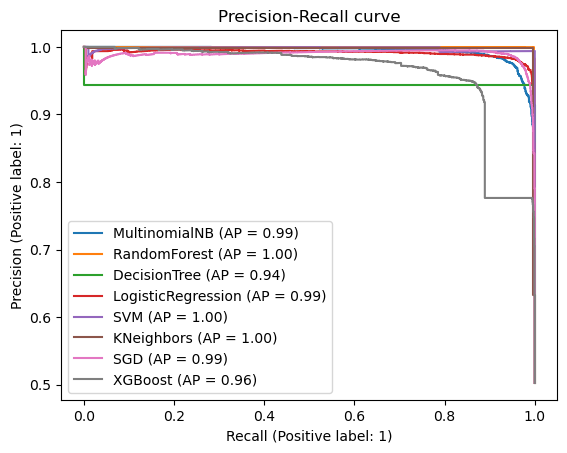

In [45]:
# precision-recall curves for 6 models
test_model = [MultinomialNB(), RandomForestClassifier(), DecisionTreeClassifier(), 
              LogisticRegression(solver='saga'), SVC(), KNeighborsClassifier(), SGDClassifier(), XGBClassifier()]
models = ['MultinomialNB', 'RandomForest', 'DecisionTree', 'LogisticRegression', 'SVM', 'KNeighbors', 'SGD', 'XGBoost']

for idx, val in enumerate(test_model):
    pipe = make_pipeline(TfidfVectorizer(), val)
    pipe.fit(X_train, y_train)
    PrecisionRecallDisplay.from_estimator(pipe, X_val, y_val, ax=plt.gca(), name=models[idx])

plt.title('Precision-Recall curve')
plt.show()

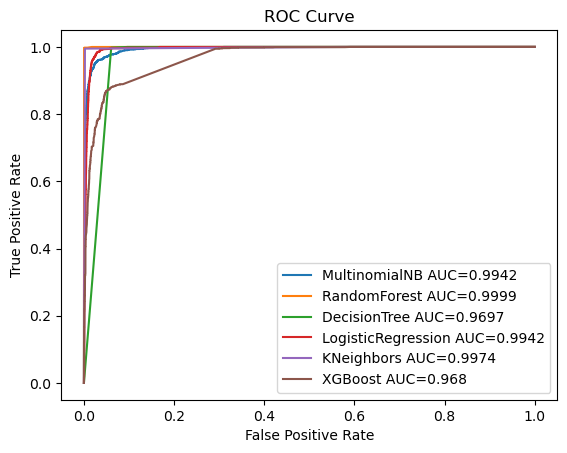

In [49]:
# ROC scores and curves for 6 models
test_model = [MultinomialNB(), RandomForestClassifier(), DecisionTreeClassifier(),
              LogisticRegression(solver='saga'), KNeighborsClassifier(), XGBClassifier()]
models = ['MultinomialNB', 'RandomForest', 'DecisionTree', 'LogisticRegression', 'KNeighbors', 'XGBoost']

for idx, val in enumerate(test_model):
    pipe = make_pipeline(TfidfVectorizer(), val)
    pipe.fit(X_train, y_train)
    y_pred = pipe.predict_proba(X_val)
    y_pred = y_pred[:, 1]
    fpr, tpr, _ = roc_curve(y_val, y_pred)
    auc = round(roc_auc_score(y_val, y_pred), 4)
    plt.plot(fpr, tpr, label=models[idx]+' AUC='+str(auc))

plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

# Model test

### 1. model create (pkl) and test using test dataset

In [51]:
import numpy as np

In [52]:
test_data.head()

,id,tweet,features,tokens
0,31963,studiolife aislife requires passion dedication...,studiolife aislife requires passion dedication...,"[studiolife, aislife, requires, passion, dedic..."
1,31964,white supremacists want everyone to see the ne...,white supremacist want everyone see new bird m...,"[white, supremacist, want, everyone, see, new,..."
2,31965,safe ways to heal your acne altwaystoheal heal...,safe way heal acne altwaystoheal healthy healing,"[safe, way, heal, acne, altwaystoheal, healthy..."
3,31966,is the hp and the cursed child book up for res...,hp cursed child book reservation already yes h...,"[hp, cursed, child, book, reservation, already..."
4,31967,3rd bihday to my amazing hilarious nephew eli ...,3rd bihday amazing hilarious nephew eli ahmir ...,"[3rd, bihday, amazing, hilarious, nephew, eli,..."


In [53]:
pipe = make_pipeline(TfidfVectorizer(), RandomForestClassifier())
model = pipe.fit(X_train, y_train)

#creat model
import pickle
pickle.dump(model, open("model_RF.pkl","wb"))

In [54]:
def predict(tweet):
    tweet = pd.Series(tweet)
    yhat = ((np.ravel(model.predict(tweet)).tolist()))
    if yhat[-1] == 1:
        # print('Hate speech Detected.')
        return 1
    if yhat[-1] == 0:
        # print('Not a Hate speech.')
        return 0

In [55]:
hate, nohate = [], []
for id, tweet in zip(test_data.id, test_data.features):
    # print('tweet: ', tweet)
    pred = predict(tweet)
    if pred == 0:
        nohate.append(id)
    if pred == 1:
        hate.append(id)

In [56]:
print(len(hate), len(nohate))

1438 15759


### 2. Word Frequency Analysis

In [57]:
total_words2 = []
hate_tweets2 = []

for id in hate:
    for i in list(test_data.loc[test_data['id'] == id].tokens)[0]:
        # print(i)
        hate_tweets2.append(i)

for id in nohate:
    for j in list(test_data.loc[test_data['id'] == id].tokens)[0]:
        total_words2.append(j)

print(len(total_words2), len(hate_tweets2))

122425 10055


In [58]:
word_count2 = Counter(total_words2)
dict(word_count2.most_common(10))

{'love': 1523,
 'day': 1417,
 'happy': 937,
 'amp': 712,
 'time': 665,
 'life': 627,
 'today': 581,
 'new': 539,
 'get': 514,
 'positive': 489}

In [59]:
hate_count2 = Counter(hate_tweets2)
dict(hate_count2.most_common(10))

{'trump': 194,
 'amp': 113,
 'white': 111,
 'black': 95,
 'woman': 93,
 'racist': 73,
 'people': 64,
 'like': 62,
 'libtard': 57,
 'hate': 53}

### 3. Generate Word Clouds

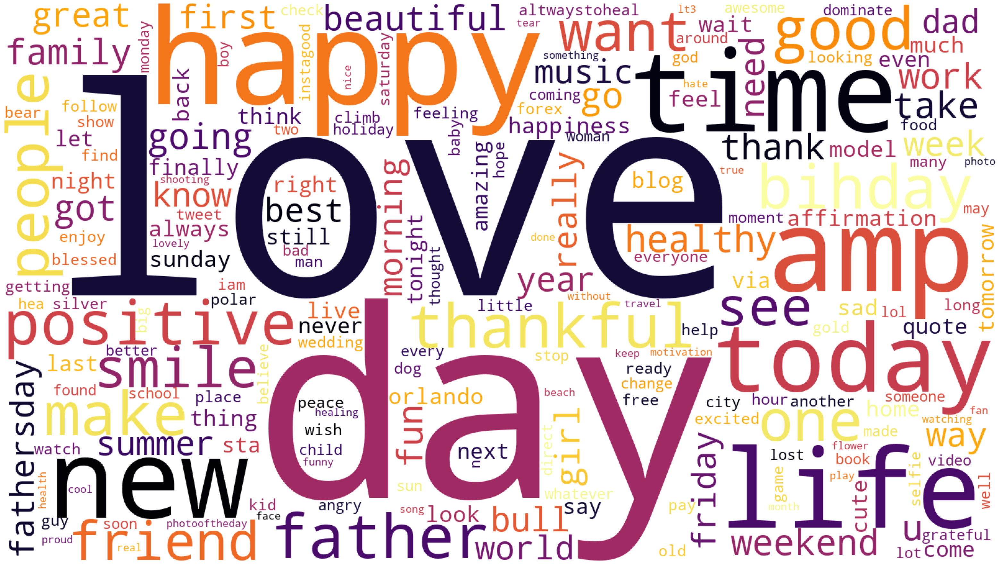

In [60]:
wordcloud = WordCloud(width=1600, height=900, random_state=1,
                      background_color='white', colormap=matplotlib.cm.inferno,
                      collocations=False).generate(' '.join(total_words2))

# Plot
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud)
plt.axis("off")

# Save image
wordcloud.to_file("wordcloud_total2.png")

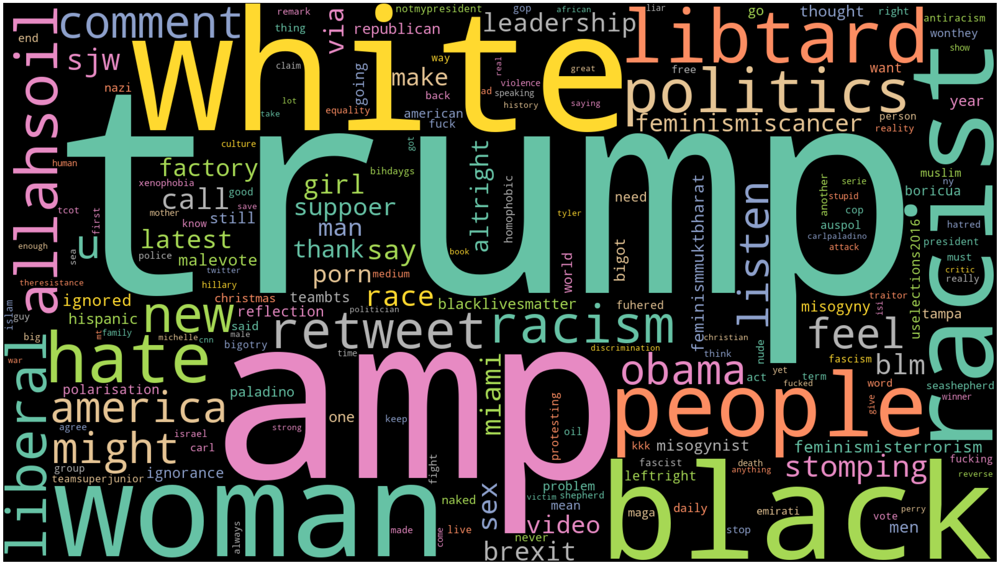

In [61]:
wordcloud = WordCloud(width=1600, height=900, random_state=1,
                      background_color="black", colormap='Set2',
                      collocations=False).generate(' '.join(hate_tweets2))

# Plot
plt.figure(figsize=(40, 30))
plt.imshow(wordcloud)
plt.axis("off")

# Save image
wordcloud.to_file("wordcloud_hate2.png")

# Data Modeling - LSTM model

### Long Short-Term Memory (LSTM) model (run in Colab)

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 1. Data preprocessing

### 1.1 Load modules and dataset

In [ ]:
import nltk
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('punkt')
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


True

In [ ]:
# !pip install contractions

In [ ]:
import numpy as np
import pandas as pd

## for feature extraction
import re
import contractions
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer

## for data model
from sklearn.model_selection import train_test_split

In [ ]:
train_data = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/data/train_E6oV3lV.csv")
test_data = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/data/test_tweets_anuFYb8.csv')

train = train_data.copy()
train_data['label'] = train_data['label'].astype('category')
train_data.head()

,id,label,tweet
0,1,0,@user when a father is dysfunctional and is s...
1,2,0,@user @user thanks for #lyft credit i can't us...
2,3,0,bihday your majesty
3,4,0,#model i love u take with u all the time in ...
4,5,0,factsguide: society now #motivation


### 1.2 Data Cleaning

In [ ]:
def clean_text(text): # Remove URLs & mentions
    text = re.sub(r'http\S+', '', text)
    text = re.sub(r'@\w+', '', text)
    return text

def expand_contractions(text): # Expand contractions in text processing
    expanded_words = []
    for tx in text.split():
        #if tx != contractions.fix(tx): print(tx, contractions.fix(tx))
        expanded_words.append(contractions.fix(tx))
    new_text = ' '.join(expanded_words)
    return new_text

def remove_non_alpha(new_text):  # Extract only alphabets
    new_text = re.sub(r'[^a-zA-Z0-9\s]', '', new_text.lower())
    return new_text

def remove_stopwords(new_text): # Removing Stopwords
    stop_words = set(stopwords.words('english'))
    return " ".join(token for token in new_text.split() if token not in stop_words)

def word_lemma(new_text): # Remmatizer
    return " ".join([WordNetLemmatizer().lemmatize(token) for token in new_text.split()])

def tokenizer(new_text):
    return [token for token in new_text.split()]

def create_label(emotion): # Replace emotions to label
    emotion_label = {}
    for idx, val in enumerate(df.emotion.unique()):
        emotion_label[val] = idx
    return emotion_label[emotion]

def drop_column(df, column): # Drop column
    df = df.drop([column], axis=1)
    return df

for df in [train_data, test_data]:
    df['tweet'] = df['tweet'].apply(clean_text)
    df['tweet'] = df['tweet'].apply(expand_contractions)
    df['tweet'] = df['tweet'].apply(remove_non_alpha)
    df['features'] = df['tweet'].apply(remove_stopwords)
    df['features'] = df['features'].apply(word_lemma)
    df['tokens'] = df['features'].apply(tokenizer)

## 2. NN model

### 2.1 Import Libraries

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Dropout
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping

### 2.2 Oversampling

In [ ]:
# Upsampling for imbalanced data
label_0 = train_data[train_data['label'] == 0] # label counting
label_1 = train_data[train_data['label'] == 1]

oversample = label_1.sample(len(label_0), replace=True, random_state=123)
train_oversampled = pd.concat([oversample, label_0], axis=0)
train_oversampled = train_oversampled.sample(frac = 1)
print(train_oversampled['label'].value_counts())
train_oversampled

0    29720
1    29720
Name: label, dtype: int64


,id,label,tweet,features,tokens
23528,23529,0,mass shooting at orlando gay nightclub what we...,mass shooting orlando gay nightclub know unbel...,"[mass, shooting, orlando, gay, nightclub, know..."
6613,6614,1,shot to racism shot disparo trompas trumpas mi...,shot racism shot disparo trompas trumpas migit...,"[shot, racism, shot, disparo, trompas, trumpas..."
1711,1712,0,i am thankful you vote to leave the eu the rem...,thankful vote leave eu remain team right brexi...,"[thankful, vote, leave, eu, remain, team, righ..."
10477,10478,1,if you say the nazis said that hatred amp bigo...,say nazi said hatred amp bigotry found extremi...,"[say, nazi, said, hatred, amp, bigotry, found,..."
1318,1319,0,it is 250 days on happy today 1014 masutanic...,250 day happy today 1014 masutanicouple 250day...,"[250, day, happy, today, 1014, masutanicouple,..."
...,...,...,...,...,...
7379,7380,1,no it does not germans even fascists rape too ...,german even fascist rape help,"[german, even, fascist, rape, help]"
26670,26671,1,it is truly sad a who lot of working class men...,truly sad lot working class men resent offered...,"[truly, sad, lot, working, class, men, resent,..."
4173,4174,0,amp bernie is no barack weak,amp bernie barack weak,"[amp, bernie, barack, weak]"
24289,24290,0,i am intelligentiam positive affirmation,intelligentiam positive affirmation,"[intelligentiam, positive, affirmation]"


### 2.3 Split Data 

In [ ]:
# Splite data to training and test
train_df, val_df = train_test_split(train_oversampled, test_size=0.2, random_state=42)
print(len(train_df), len(val_df))

47552 11888


### 2.4 Tokenize and Pad Text Data

In [ ]:
# Tokenize and pad text data
max_words = 10000
max_len = 30
tokenizer = Tokenizer(num_words=max_words, oov_token='<OOV>')
tokenizer.fit_on_texts(train_df['features'])
train_seq = tokenizer.texts_to_sequences(train_df['features'])
val_seq = tokenizer.texts_to_sequences(val_df['features'])
train_padded = pad_sequences(train_seq, maxlen=max_len, padding='post', truncating='post')
val_padded = pad_sequences(val_seq, maxlen=max_len, padding='post', truncating='post')

### 2.5 Load GloVe Embeddings 

In [ ]:
# load GloVe
em_dim = 100
em_index = {}
with open(f'/content/drive/MyDrive/Colab Notebooks/CIS511/dataset/glove.6B.{em_dim}d.txt', 'r', encoding='utf-8') as f:
    for line in f:
        values = line.split()
        word = values[0]
        coefs = np.asarray(values[1:], dtype='float32')
        em_index[word] = coefs

In [ ]:
# Create an embedding matrix
em_matrix = np.zeros((max_words, em_dim))
for word, i in tokenizer.word_index.items():
    if i < max_words:
        em_vector = em_index.get(word)
        if em_vector is not None:
            em_matrix[i] = em_vector

### 2.6 NN Model Architecture

In [ ]:
# NN model
model = Sequential()
model.add(Embedding(input_dim=max_words, output_dim=em_dim, input_length=max_len, weights=[em_matrix], trainable=False))
model.add(LSTM(64, return_sequences=True))
model.add(LSTM(64))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(2, activation='softmax'))

optimizer = Adam(clipnorm=1.0)
model.compile(optimizer=optimizer, loss='sparse_categorical_crossentropy', metrics=['accuracy'])

model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 30, 100)           1000000   
                                                                 
 lstm (LSTM)                 (None, 30, 64)            42240     
                                                                 
 lstm_1 (LSTM)               (None, 64)                33024     
                                                                 
 dense (Dense)               (None, 64)                4160      
                                                                 
 dropout (Dropout)           (None, 64)                0         
                                                                 
 dense_1 (Dense)             (None, 2)                 130       
                                                                 
Total params: 1079554 (4.12 MB)
Trainable params: 79554 

### 2.7 Train and Evaluate Model

In [ ]:
# Train and Evaluate model
model.fit(train_padded, train_df['label'], epochs=10, validation_data=(val_padded, val_df['label']))
val_loss, val_accuracy = model.evaluate(val_padded, val_df['label'])
print(f'Validation Accuracy: {val_accuracy * 100:.2f}%')

Epoch 1/10
1486/1486 [==============================] - 57s 36ms/step - loss: 0.3129 - accuracy: 0.8761 - val_loss: 0.1990 - val_accuracy: 0.9224
Epoch 2/10
1486/1486 [==============================] - 52s 35ms/step - loss: 0.1740 - accuracy: 0.9397 - val_loss: 0.1507 - val_accuracy: 0.9418
Epoch 3/10
1486/1486 [==============================] - 50s 34ms/step - loss: 0.1100 - accuracy: 0.9657 - val_loss: 0.0895 - val_accuracy: 0.9688
Epoch 4/10
1486/1486 [==============================] - 52s 35ms/step - loss: 0.0806 - accuracy: 0.9771 - val_loss: 0.0809 - val_accuracy: 0.9759
Epoch 5/10
1486/1486 [==============================] - 50s 34ms/step - loss: 0.0608 - accuracy: 0.9844 - val_loss: 0.0879 - val_accuracy: 0.9701
Epoch 6/10
1486/1486 [==============================] - 52s 35ms/step - loss: 0.0483 - accuracy: 0.9877 - val_loss: 0.0771 - val_accuracy: 0.9745
Epoch 7/10
1486/1486 [==============================] - 51s 34ms/step - loss: 0.0394 - accuracy: 0.9896 - val_loss: 0.0528 -

### 2.8 creat model

In [62]:
#creat model
pickle.dump(model, open("model_LSTM.pkl","wb"))